In [1]:
import cv2
import numpy as np

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    blurred_image = cv2.GaussianBlur(hsv_image, (5, 5), 0)
    return blurred_image

In [2]:
def segment_plant(blurred_image):
    lower_green = np.array([30, 40, 40])  # Adjust these values as needed
    upper_green = np.array([90, 255, 255])
    mask = cv2.inRange(blurred_image, lower_green, upper_green)
    return mask

In [3]:
def extract_features(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    features = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 500:  # Filter small contours
            bounding_box = cv2.boundingRect(contour)
            height = bounding_box[3]  # Height of the bounding box
            features.append((area, height))
    return features

In [4]:
import matplotlib.pyplot as plt

def visualize_growth(images, features):
    fig, axes = plt.subplots(len(images), 2, figsize=(10, len(images) * 5))
    for i, (image_path, feature) in enumerate(zip(images, features)):
        image = cv2.imread(image_path)
        mask = segment_plant(preprocess_image(image_path))
        
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f'Original Image - Area: {feature[0]:.2f}, Height: {feature[1]}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title('Segmented Mask')
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [5]:
def analyze_growth(features):
    areas = [feature[0] for feature in features]
    heights = [feature[1] for feature in features]
    
    plt.figure(figsize=(10, 5))
    plt.plot(areas, label='Area', marker='o')
    plt.plot(heights, label='Height', marker='o')
    plt.title('Plant Growth Analysis')
    plt.xlabel('Growth Stages')
    plt.ylabel('Measurements')
    plt.legend()
    plt.show()

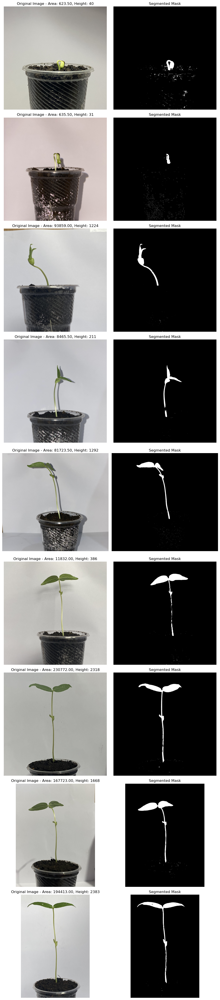

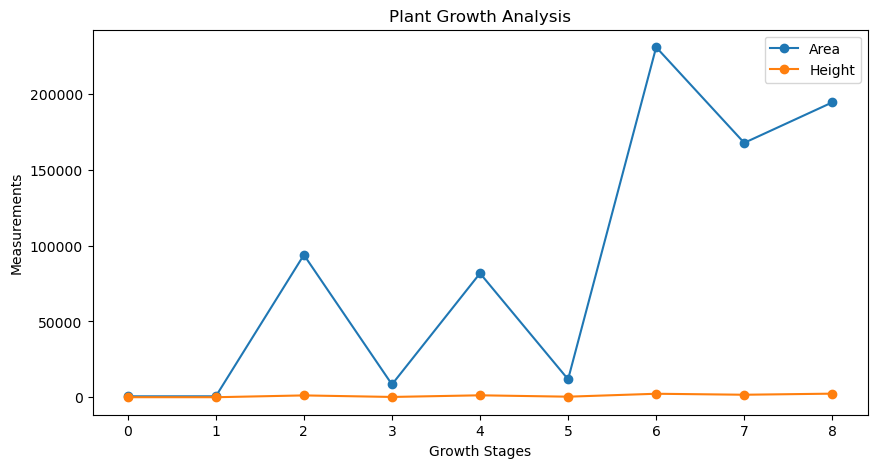

In [6]:
image_paths = ['growth/1.jpg', 'growth/2.jpg', 'growth/3.jpg','growth/4.jpg', 'growth/5.jpg', 'growth/6.jpg', 'growth/7.jpg', 'growth/8.jpg', 'growth/9.jpg']  # Replace with your image paths
features = []

for image_path in image_paths:
    blurred_image = preprocess_image(image_path)
    mask = segment_plant(blurred_image)
    feature = extract_features(mask)
    features.append(feature[0])  # Store the first feature for simplicity

visualize_growth(image_paths, features)
analyze_growth(features)

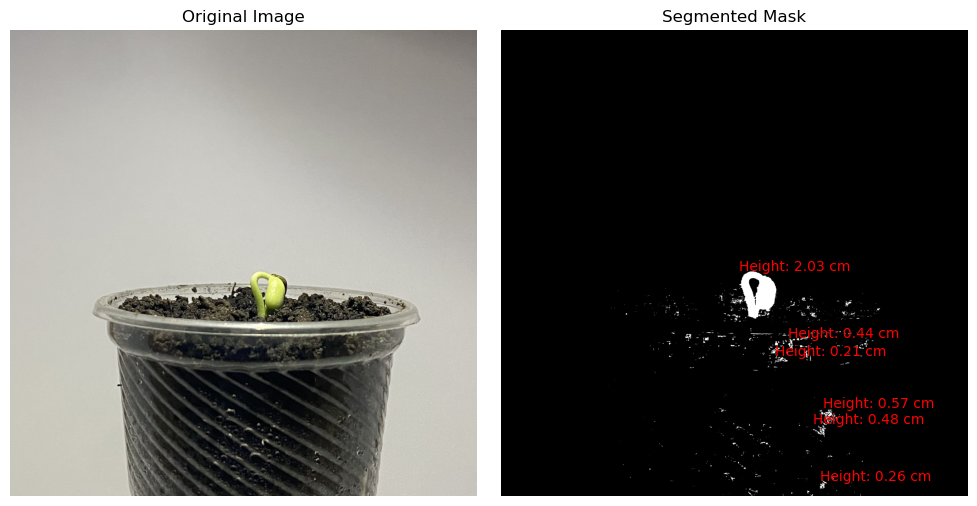

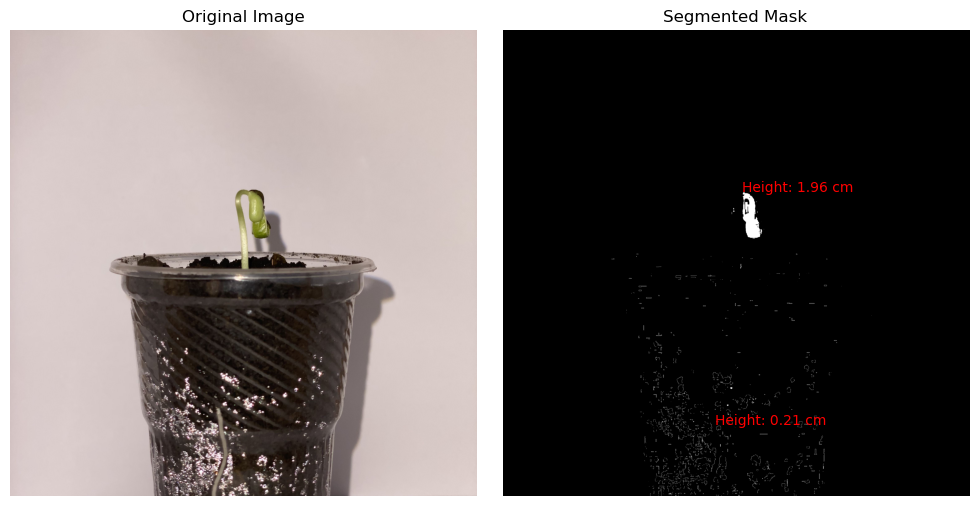

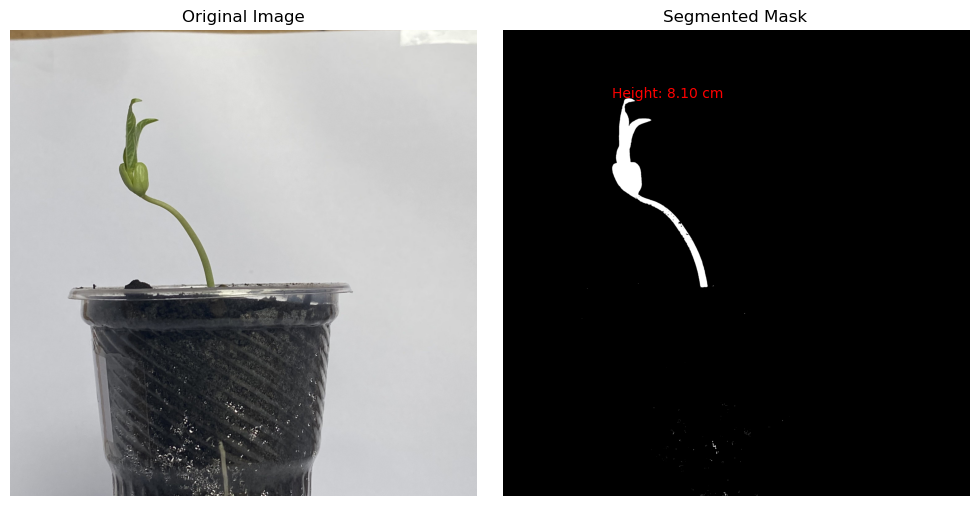

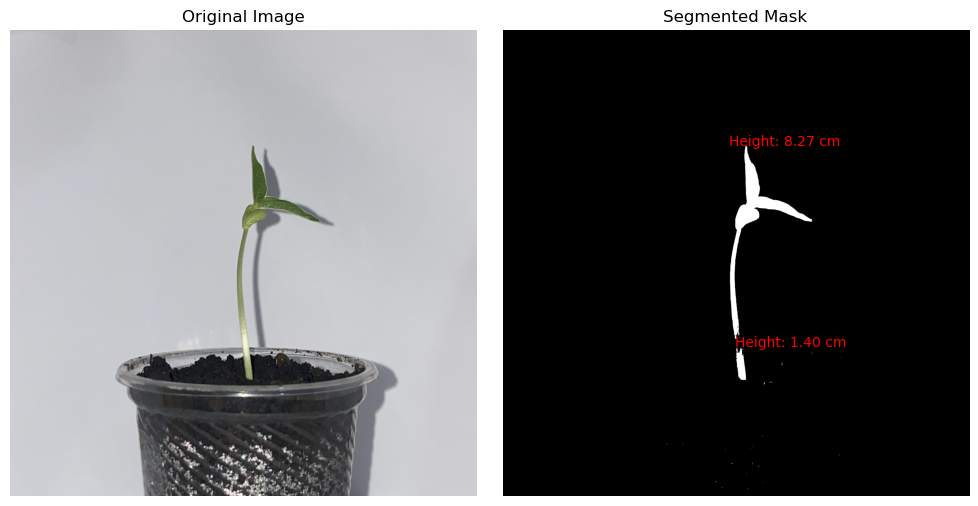

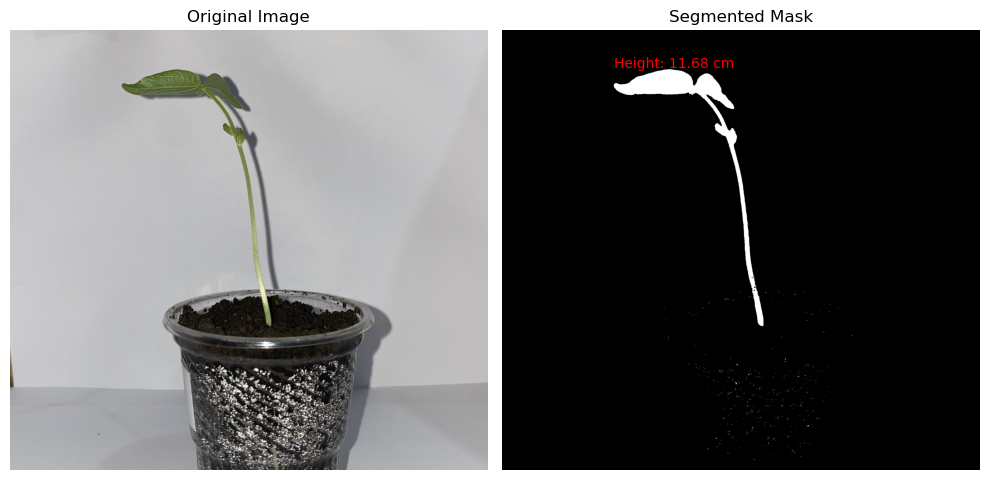

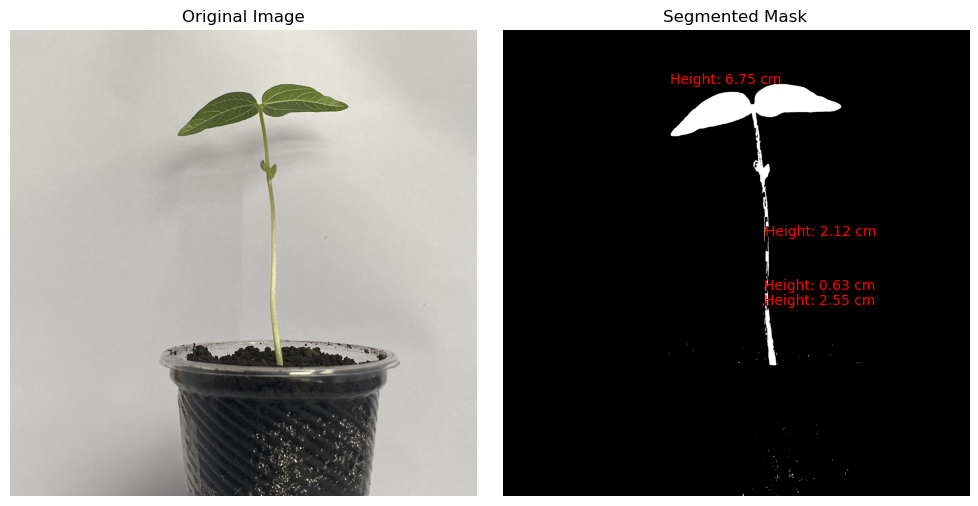

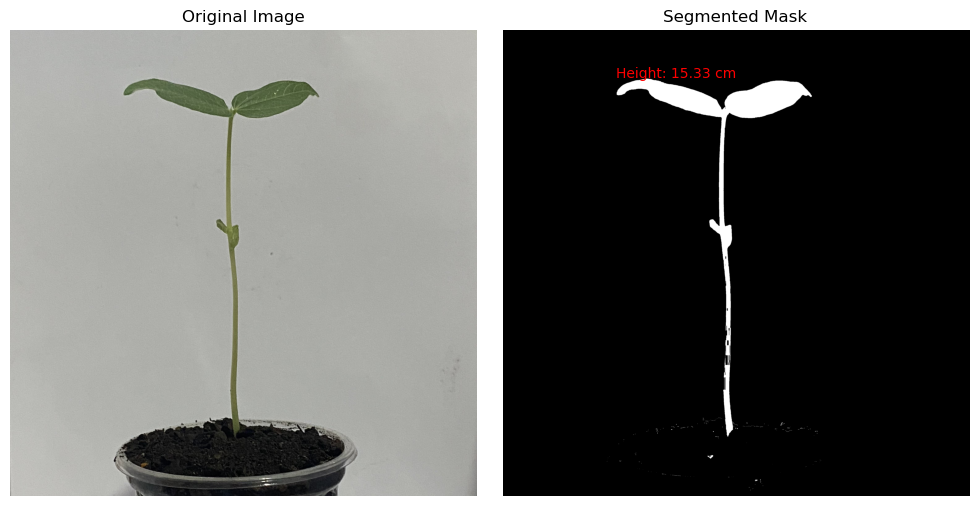

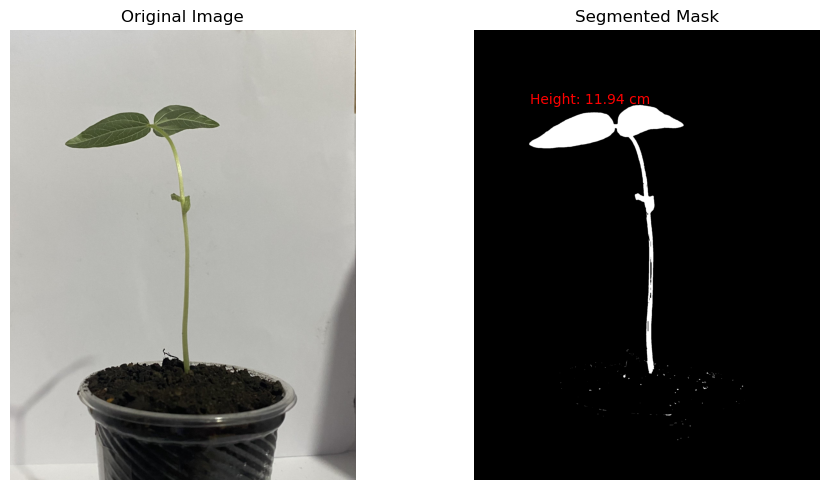

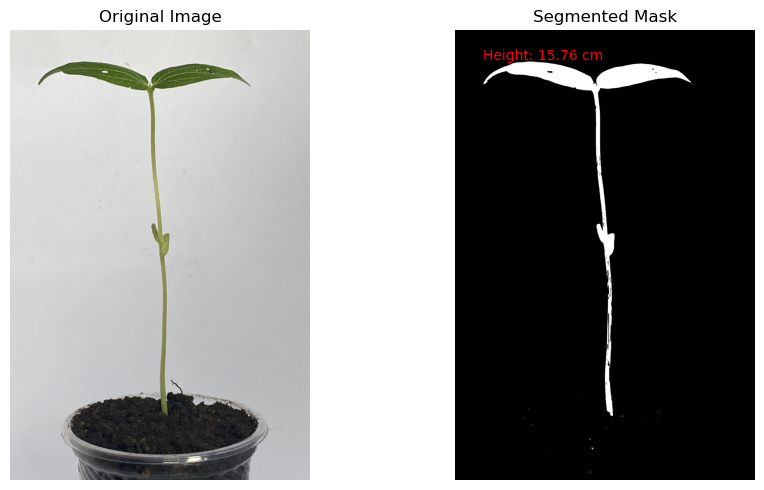

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    blurred_image = cv2.GaussianBlur(hsv_image, (5, 5), 0)
    return blurred_image, image

def segment_plant(blurred_image):
    lower_green = np.array([30, 40, 40])  # Adjust these values as needed
    upper_green = np.array([90, 255, 255])
    mask = cv2.inRange(blurred_image, lower_green, upper_green)
    return mask

def extract_features(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    features = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 500:  # Filter small contours
            bounding_box = cv2.boundingRect(contour)
            height = bounding_box[3]  # Height of the bounding box in pixels
            features.append((area, height, bounding_box))
    return features

def measure_height_in_cm(pixel_height, reference_height_cm, image_height_pixels):
    return (pixel_height / image_height_pixels) * reference_height_cm

def visualize_growth(image, mask, features, reference_height_cm, image_height_pixels):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title('Segmented Mask')
    plt.axis('off')

    for area, height, bounding_box in features:
        x, y, w, h = bounding_box
        plant_height_cm = measure_height_in_cm(height, reference_height_cm, image_height_pixels)
        plt.text(x, y - 10, f'Height: {plant_height_cm:.2f} cm', color='red', fontsize=10)

    plt.tight_layout()
    plt.show()

# Example usage for multiple images
image_paths = ['growth/1.jpg', 'growth/2.jpg', 'growth/3.jpg','growth/4.jpg', 'growth/5.jpg', 'growth/6.jpg', 'growth/7.jpg', 'growth/8.jpg', 'growth/9.jpg']

reference_height_cm = 20  # Height of the reference object in cm

for image_path in image_paths:
    blurred_image, original_image = preprocess_image(image_path)
    mask = segment_plant(blurred_image)
    features = extract_features(mask)

    # Use the height of the original image as the reference height in pixels
    image_height_pixels = original_image.shape[0]
    
    visualize_growth(original_image, mask, features, reference_height_cm, image_height_pixels)

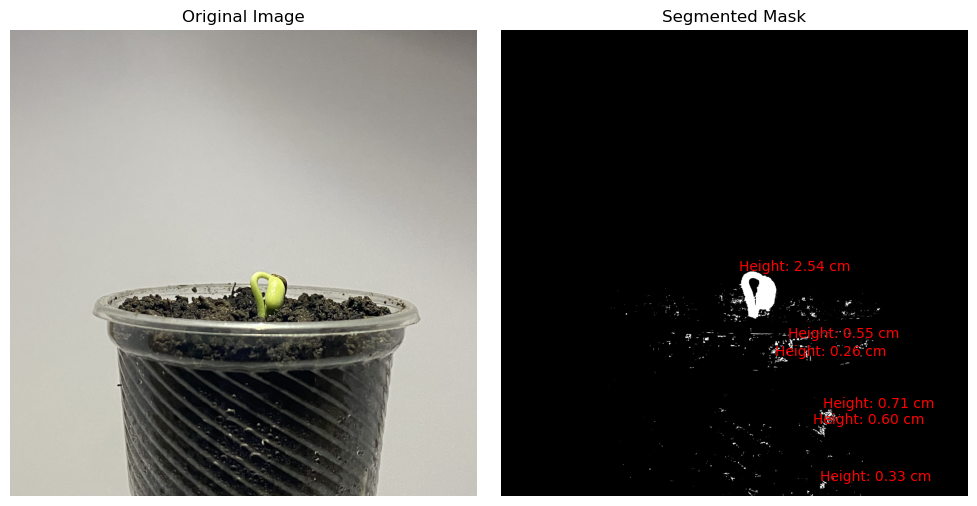

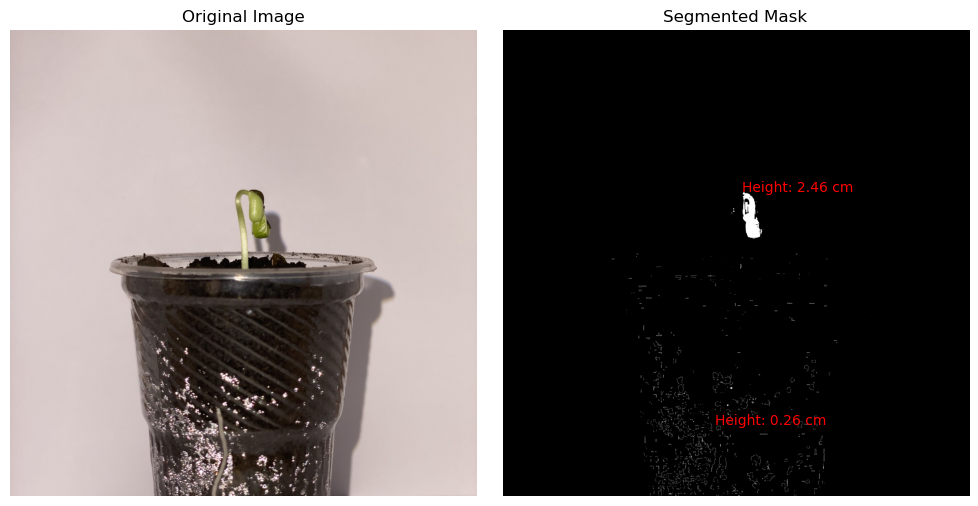

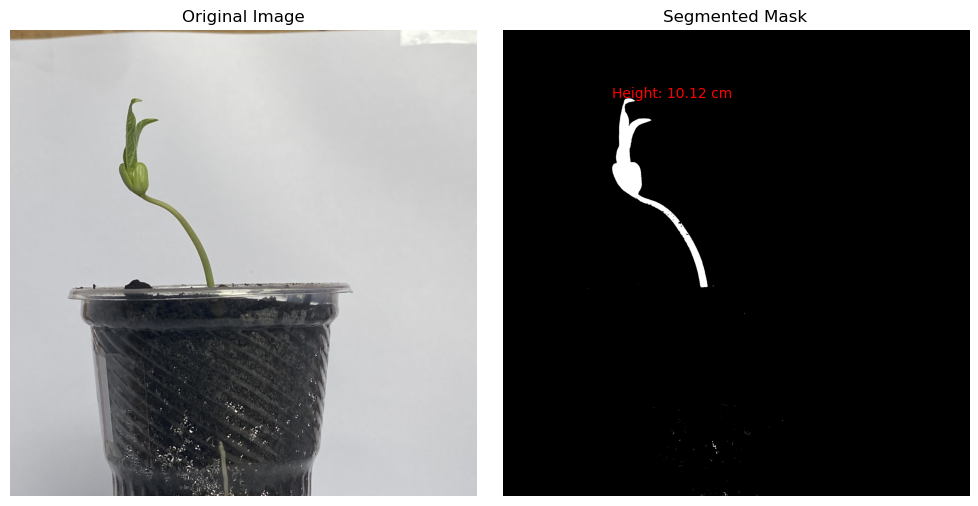

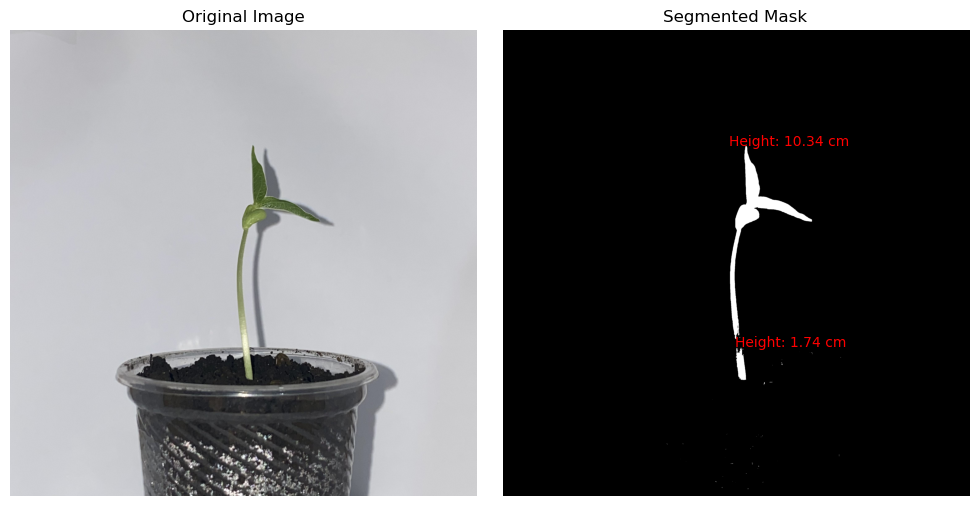

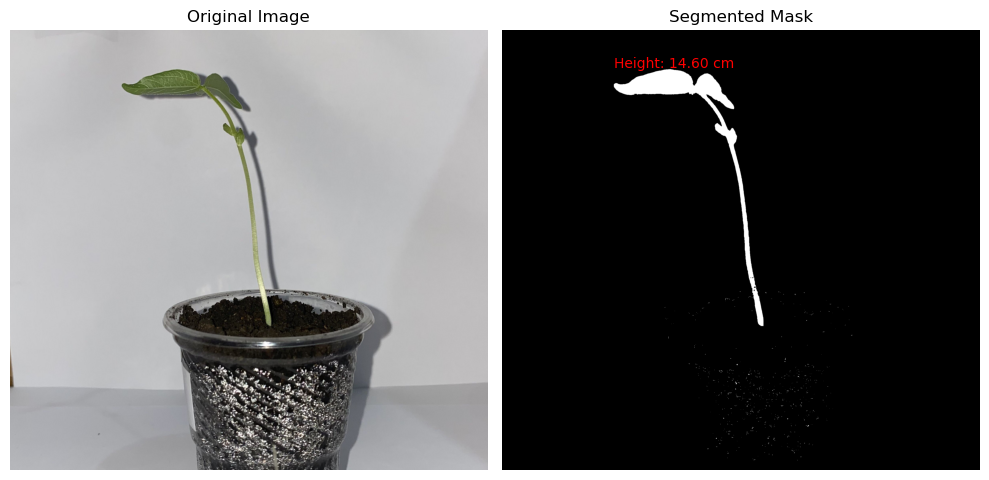

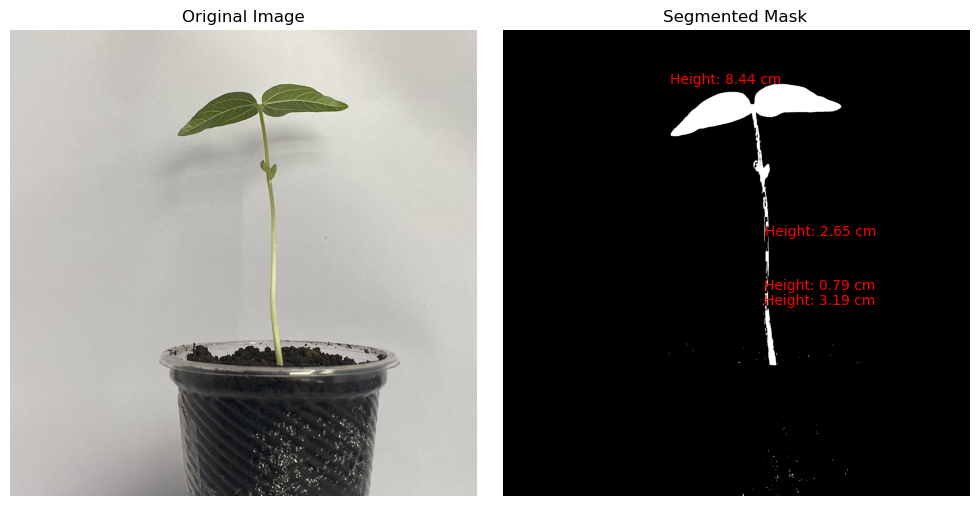

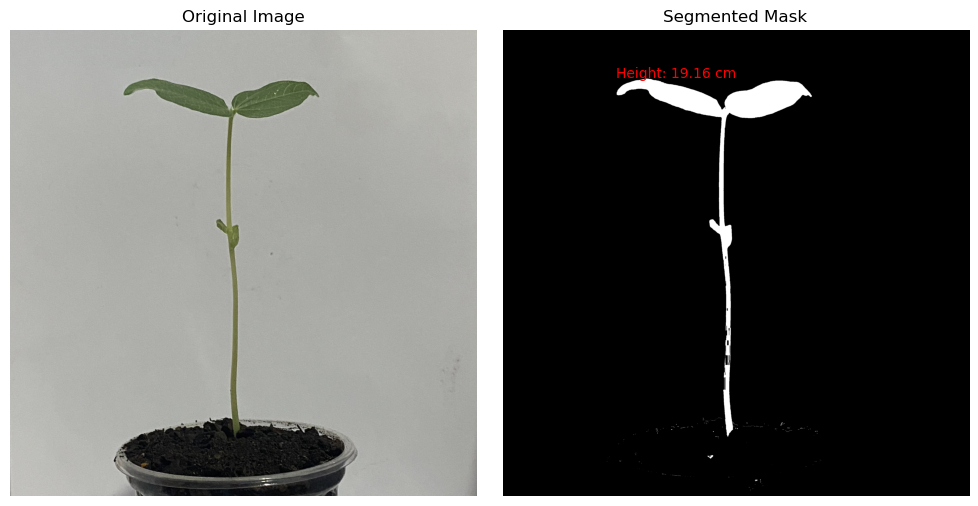

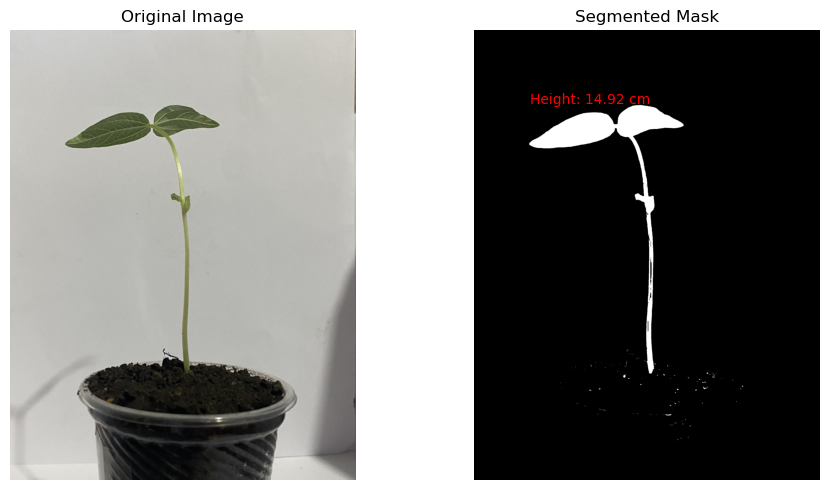

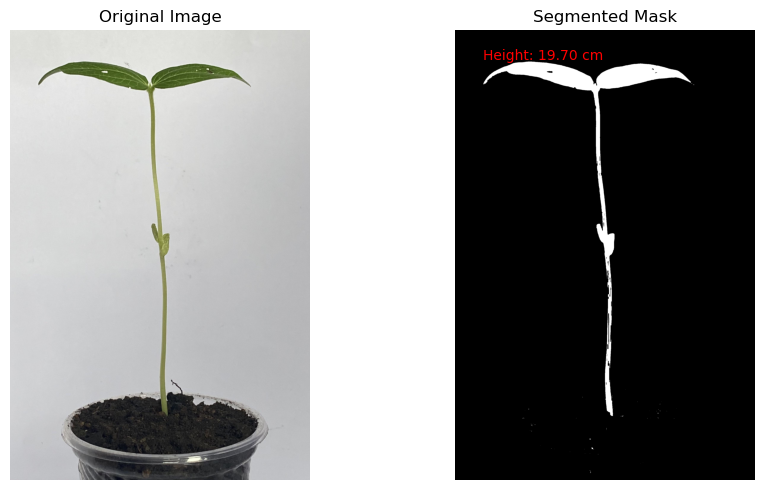

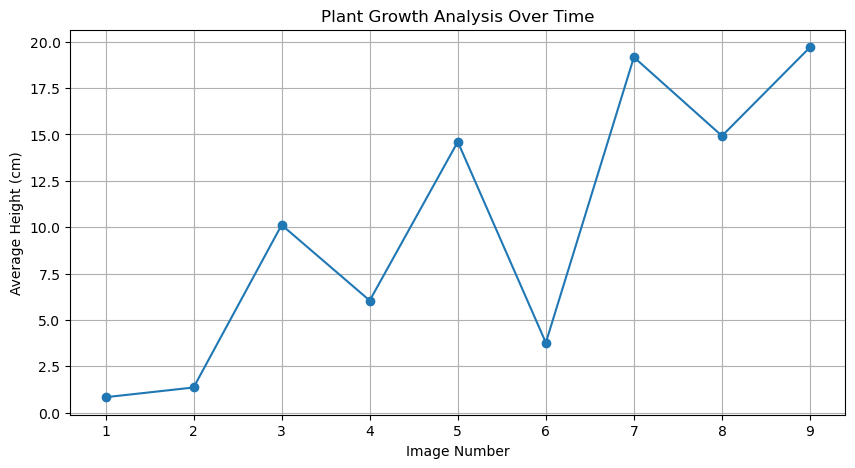

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    blurred_image = cv2.GaussianBlur(hsv_image, (5, 5), 0)
    return blurred_image, image

def segment_plant(blurred_image):
    lower_green = np.array([30, 40, 40])  # Adjust these values as needed
    upper_green = np.array([90, 255, 255])
    mask = cv2.inRange(blurred_image, lower_green, upper_green)
    return mask

def extract_features(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    features = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 500:  # Filter small contours
            bounding_box = cv2.boundingRect(contour)
            height = bounding_box[3]  # Height of the bounding box in pixels
            features.append((area, height, bounding_box))
    return features

def measure_height_in_cm(pixel_height, reference_height_cm, image_height_pixels):
    return (pixel_height / image_height_pixels) * reference_height_cm

def visualize_growth(image, mask, features, reference_height_cm, image_height_pixels):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title('Segmented Mask')
    plt.axis('off')

    for area, height, bounding_box in features:
        x, y, w, h = bounding_box
        plant_height_cm = measure_height_in_cm(height, reference_height_cm, image_height_pixels)
        plt.text(x, y - 10, f'Height: {plant_height_cm:.2f} cm', color='red', fontsize=10)

    plt.tight_layout()
    plt.show()
    return [measure_height_in_cm(height, reference_height_cm, image_height_pixels) for _, height, _ in features]

# Example usage for multiple images
image_paths = ['growth/1.jpg', 'growth/2.jpg', 'growth/3.jpg','growth/4.jpg', 'growth/5.jpg', 'growth/6.jpg', 'growth/7.jpg', 'growth/8.jpg', 'growth/9.jpg']

reference_height_cm = 25  # Height of the reference object in cm
growth_data = []

for image_path in image_paths:
    blurred_image, original_image = preprocess_image(image_path)
    mask = segment_plant(blurred_image)
    features = extract_features(mask)

    # Use the height of the original image as the reference height in pixels
    image_height_pixels = original_image.shape[0]
    
    heights = visualize_growth(original_image, mask, features, reference_height_cm, image_height_pixels)
    growth_data.append(np.mean(heights) if heights else 0)  # Store average height for the image

# Plotting the growth analysis graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(growth_data) + 1), growth_data, marker='o')
plt.title('Plant Growth Analysis Over Time')
plt.xlabel('Image Number')
plt.ylabel('Average Height (cm)')
plt.xticks(range(1, len(growth_data) + 1))
plt.grid()
plt.show()

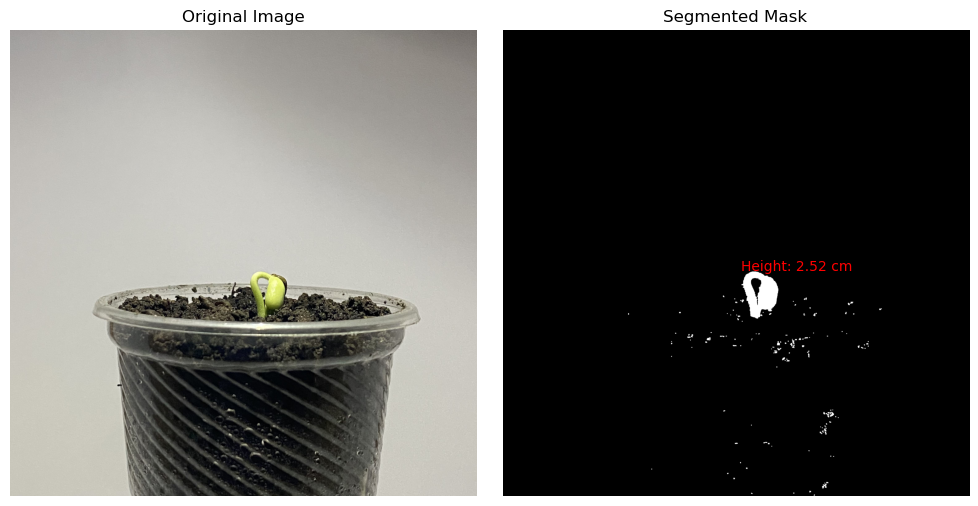

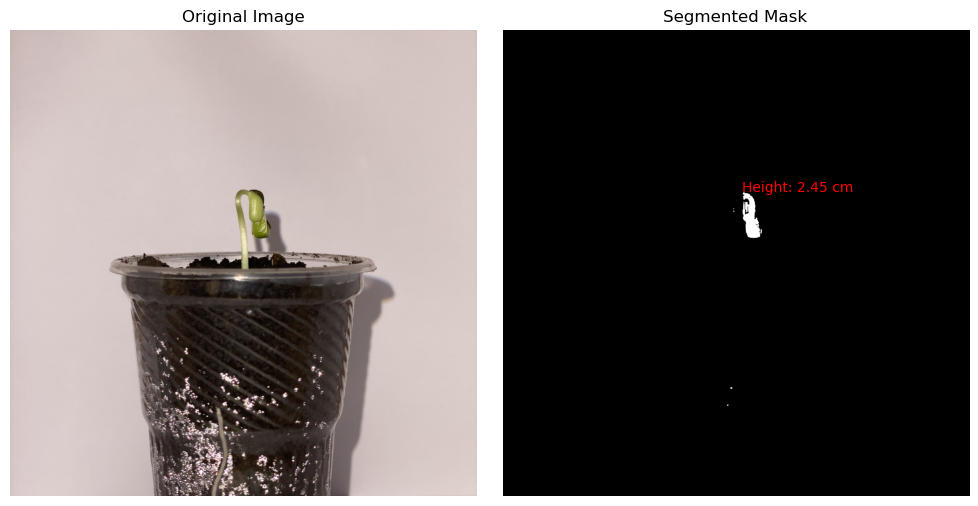

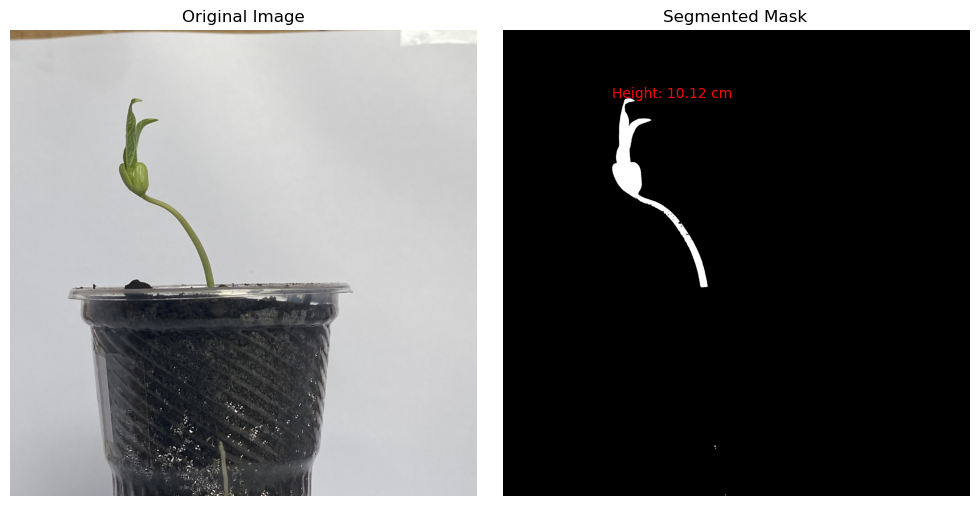

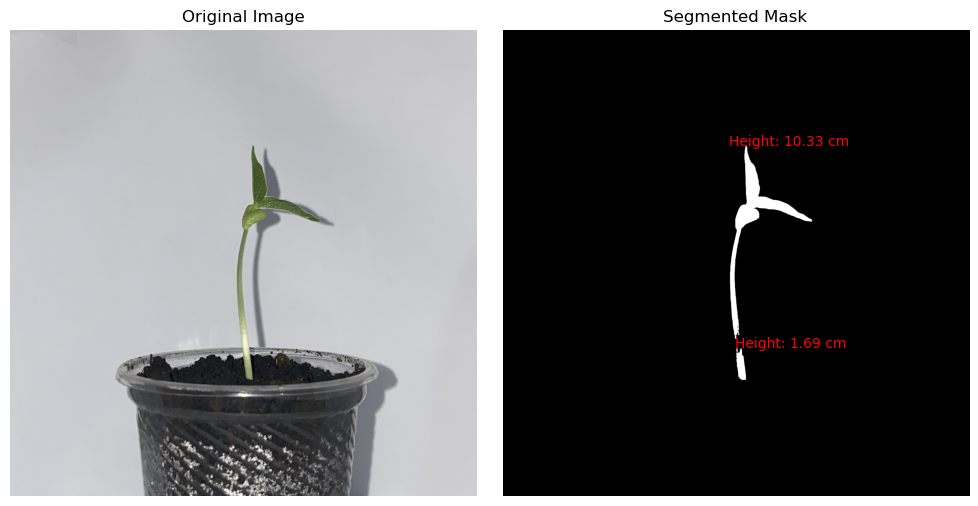

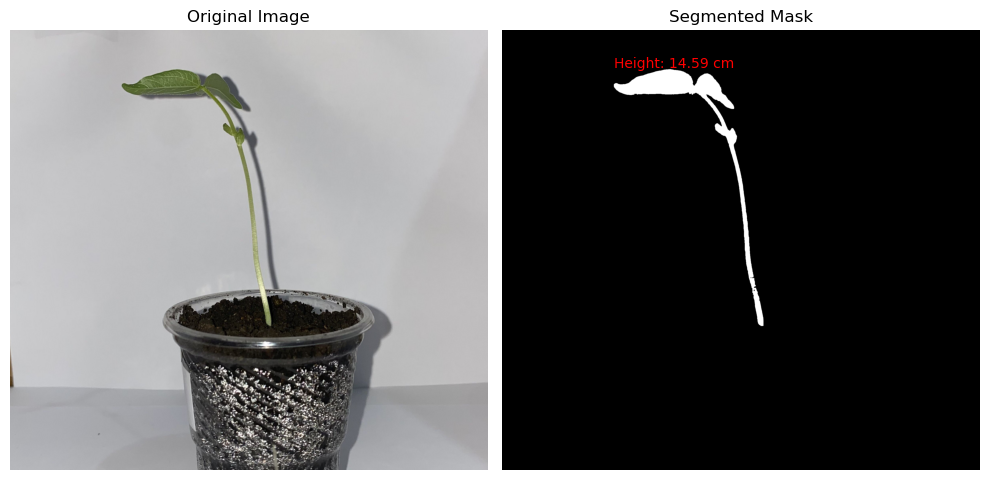

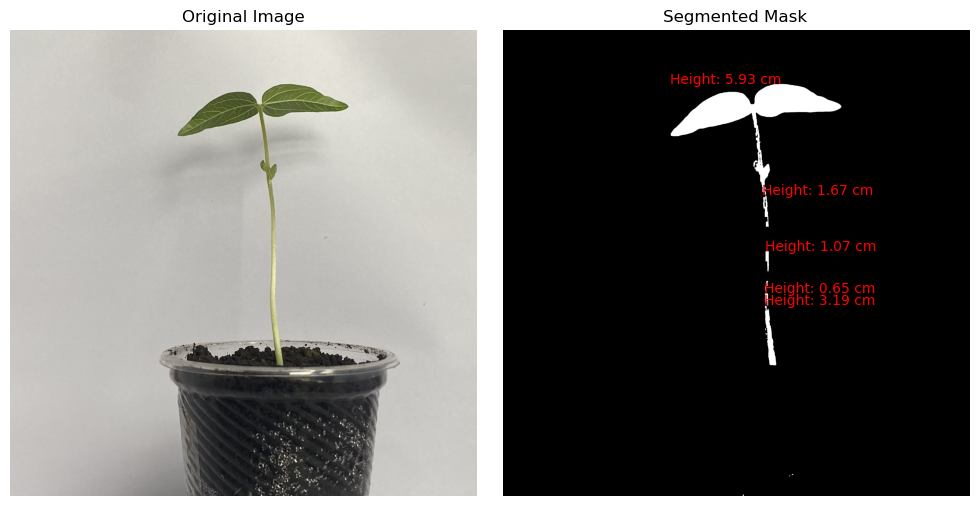

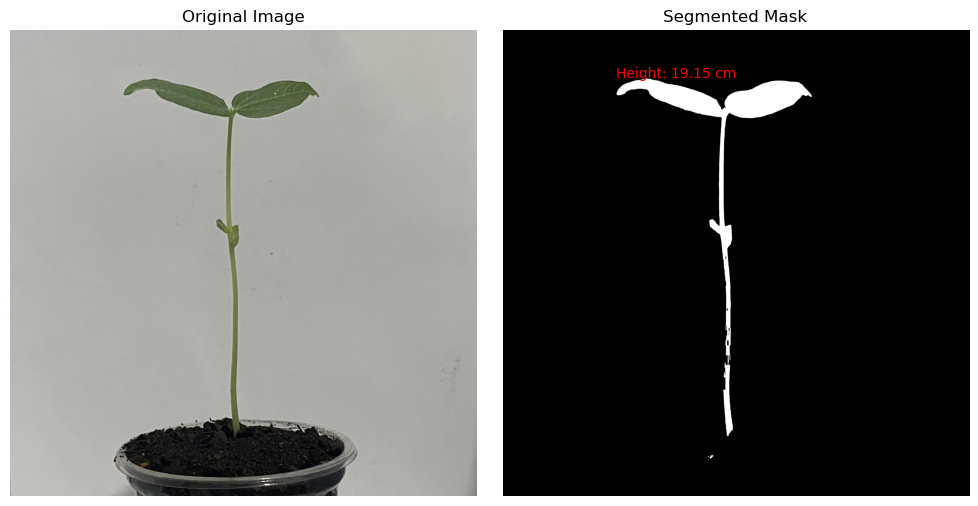

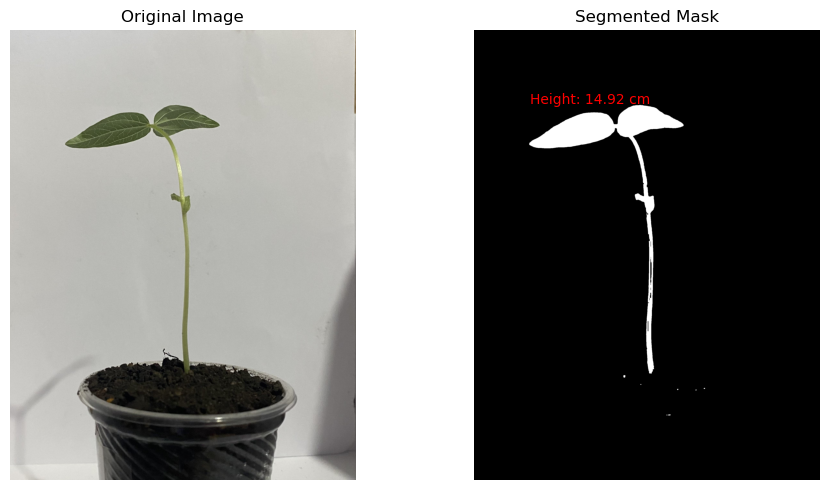

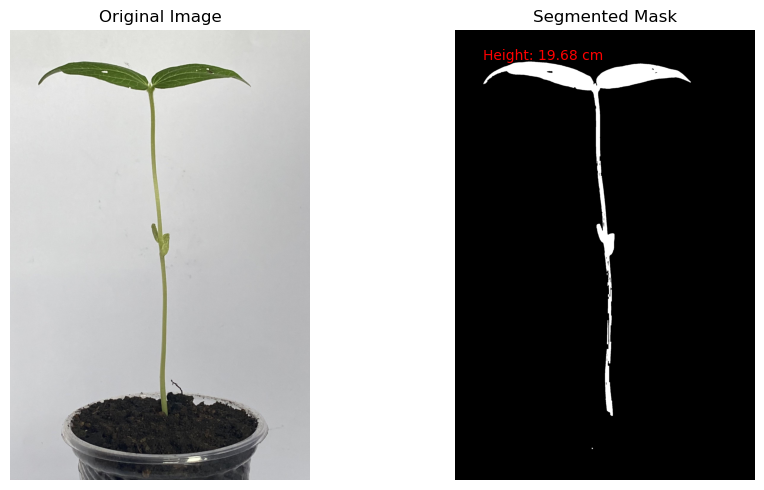

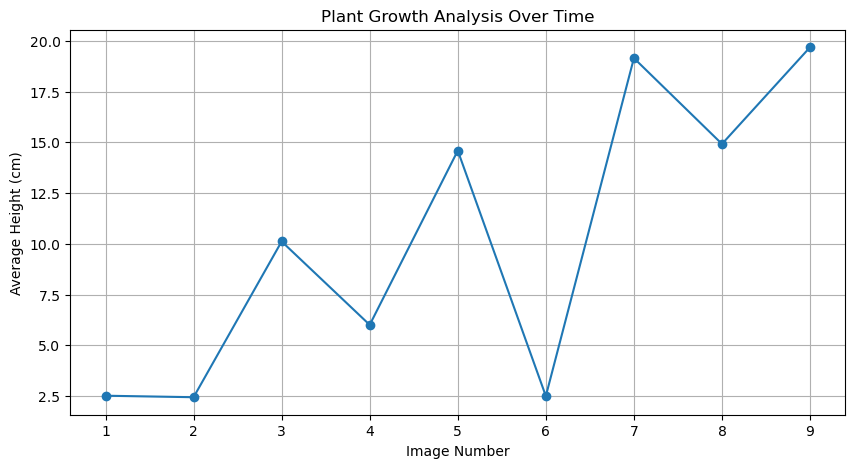

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    blurred_image = cv2.GaussianBlur(hsv_image, (5, 5), 0)
    return blurred_image, image

def segment_plant(blurred_image):
    lower_green = np.array([30, 40, 40])  # Adjust these values as needed
    upper_green = np.array([90, 255, 255])
    mask = cv2.inRange(blurred_image, lower_green, upper_green)

    # Apply morphological opening to remove small noise
    kernel = np.ones((5, 5), np.uint8)  # Define a kernel for morphological operations
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)  # Apply opening
    return mask

def extract_features(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    features = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 500:  # Filter small contours
            bounding_box = cv2.boundingRect(contour)
            height = bounding_box[3]  # Height of the bounding box in pixels
            features.append((area, height, bounding_box))
    return features

def measure_height_in_cm(pixel_height, reference_height_cm, image_height_pixels):
    return (pixel_height / image_height_pixels) * reference_height_cm

def visualize_growth(image, mask, features, reference_height_cm, image_height_pixels):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title('Segmented Mask')
    plt.axis('off')

    for area, height, bounding_box in features:
        x, y, w, h = bounding_box
        plant_height_cm = measure_height_in_cm(height, reference_height_cm, image_height_pixels)
        plt.text(x, y - 10, f'Height: {plant_height_cm:.2f} cm', color='red', fontsize=10)

    plt.tight_layout()
    plt.show()
    return [measure_height_in_cm(height, reference_height_cm, image_height_pixels) for _, height, _ in features]

# Example usage for multiple images
image_paths = ['growth/1.jpg', 'growth/2.jpg', 'growth/3.jpg', 'growth/4.jpg', 'growth/5.jpg', 
               'growth/6.jpg', 'growth/7.jpg', 'growth/8.jpg', 'growth/9.jpg']

reference_height_cm = 25  # Height of the reference object in cm
growth_data = []

for image_path in image_paths:
    blurred_image, original_image = preprocess_image(image_path)
    mask = segment_plant(blurred_image)
    features = extract_features(mask)

    # Use the height of the original image as the reference height in pixels
    image_height_pixels = original_image.shape[0]
    
    heights = visualize_growth(original_image, mask, features, reference_height_cm, image_height_pixels)
    growth_data.append(np.mean(heights) if heights else 0)  # Store average height for the image

# Plotting the growth analysis graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(growth_data) + 1), growth_data, marker='o')
plt.title('Plant Growth Analysis Over Time')
plt.xlabel('Image Number')
plt.ylabel('Average Height (cm)')
plt.xticks(range(1, len(growth_data) + 1))
plt.grid()
plt.show()